Importing all the necessary libraries

In [1]:
%pip install pandas
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
%pip install opencv-python
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as k
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
import matplotlib.pyplot as plt


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.



Mounting data base

In [2]:
%cd C:/Users/91707/OneDrive/Desktop/AI_Datasets/Healthcare_AI_Datasets/Brain_MRI
brain_df = pd.read_csv('data_mask.csv')

C:\Users\91707\OneDrive\Desktop\AI_Datasets\Healthcare_AI_Datasets\Brain_MRI


In [3]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


Having a look of first 50 data information

In [4]:
brain_df.head(50)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
5,TCGA_CS_5395_19981004,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1_...,0
6,TCGA_CS_5395_19981004,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1.tif,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1_...,0
7,TCGA_CS_5395_19981004,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1.tif,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1_...,0
8,TCGA_CS_5395_19981004,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1.tif,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1_...,0
9,TCGA_CS_5395_19981004,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1.tif,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1_...,0


In [5]:
#path to the brain MRI image
brain_df.mask_path[1]

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [6]:
#path to the segmanted mask
brain_df.image_path[1]

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

In [7]:
#Knowing the count of patient's having brain tumour in our dataset (ie 0 has no and 1 has yes)
brain_df['mask'].value_counts()

0    2556
1    1373
Name: mask, dtype: int64

Performing data visualization

In [8]:
# Knowing the number of categories
brain_df['mask'].value_counts().index

Int64Index([0, 1], dtype='int64')

In [9]:
#using plotly to plot interactive bar chart
import plotly.graph_objects as go
fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(266,0,0)', marker_line_width = 7, opacity = 0.6)
fig.show()

In [10]:
brain_df.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [11]:
brain_df.image_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

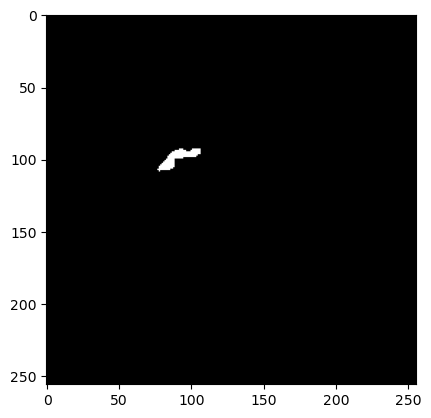

In [12]:
plt.imshow(cv2.imread(brain_df.mask_path[623]))

In [13]:
cv2.imread(brain_df.mask_path[623]).max()

255

In [14]:
cv2.imread(brain_df.mask_path[623]).min()

0

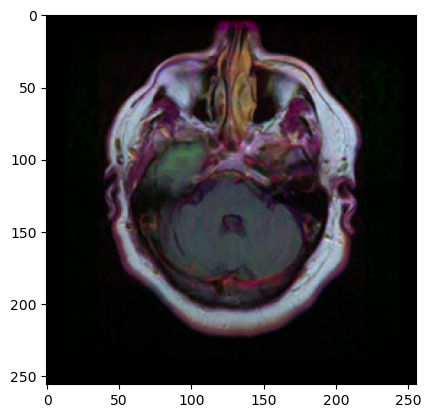

In [15]:
#ploting brain MRI using plt
plt.imshow(cv2.imread(brain_df.image_path[623]))

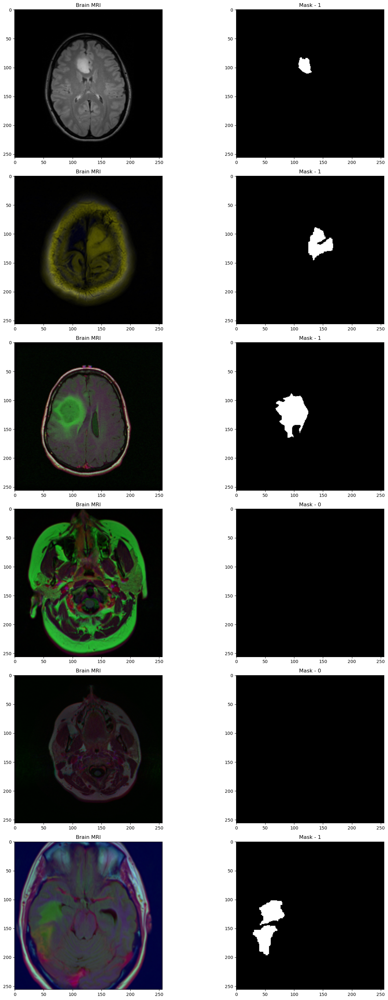

In [16]:
# Visualizing the iamges (MRI and Mask) in the dataset seperately
import random
fig, axs = plt.subplots(6,2, figsize =(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df))
  axs[count][0].title.set_text("Brain MRI")
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i]))
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i]))
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i]))
  count += 1
fig.tight_layout()

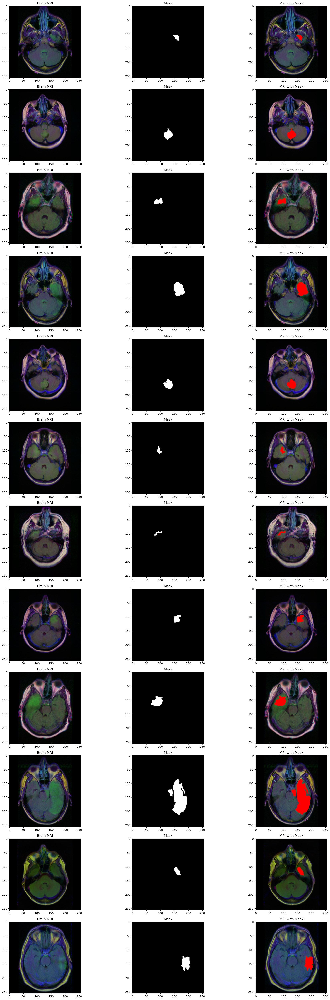

In [17]:
#Visualizing MRI scan images for only sick patients followed by corresponding mask and followed by both MRI and corresponding mask in red color on top of each other
count = 0
fig, axs = plt.subplots(12,3, figsize = (20, 50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
    img = io.imread(brain_df.image_path[i])
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')

    img[mask == 255] = (255 ,0 ,0)
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1
fig.tight_layout()

Training a classifier model to detect if tumor exists or not

In [18]:
# Droping the patient id columns from our dataset
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [19]:
# Converting the data in mask column to string format to use categorical mode in flow from data frame
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x : str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [20]:
# Splitting the data into train and test set
from sklearn.model_selection import train_test_split
train, test = train_test_split(brain_df_train, test_size = 0.15)  # 85%

In [21]:
# creating a image generator
%pip install keras-preprocessing
from keras_preprocessing.image import ImageDataGenerator
# Creating a data generator which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale = 1./255., validation_split = 0.15)

Note: you may need to restart the kernel to use updated packages.


In [22]:
train_generator = datagen.flow_from_dataframe(
    dataframe= train,
    directory= './',
    x_col = 'image_path',
    y_col = 'mask',
    subset = "training",
    batch_size = 16,
    shuffle = True,
    class_mode = "categorical",
    target_size = (256,256)
)
valid_generator = datagen.flow_from_dataframe(
    dataframe = train,
    directory = './',
    x_col = 'image_path',
    y_col = 'mask',
    subset = "validation",
    batch_size= 16,
    shuffle = True,
    clas_mode = "categorical",
    target_size = (256,256)
    )
# Creating a data generator for test images
test_datagen = ImageDataGenerator(rescale = 1./255.)
test_generator = datagen.flow_from_dataframe(
    dataframe= test,
    directory= './',
    x_col = 'image_path',
    y_col = 'mask',
    batch_size = 16,
    shuffle = False,
    class_mode = "categorical",
    target_size = (256,256)
)

Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [23]:
# Getting ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor= Input(shape = (256, 256, 3)))

In [24]:
basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [25]:
# freezing the model weights
for layer in basemodel.layers:
  layers.trainable = False

In [26]:
# Adding classification head to the base model (adding a personal touch to the ResNet)
headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name = 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)
model = Model(inputs = basemodel.input, outputs = headmodel)

In [27]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [28]:
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [29]:
# useing early stopping to exit training if validation loss 1112003 is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)
# saving the best model with least validation loss
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.hdf5", verbose=1, save_best_only=True)

In [30]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 16, epochs = 1, validation_data= valid_generator, validation_steps= valid_generator.n // 16, callbacks=[checkpointer, earlystopping])



177/177 [==============================] - ETA: 0s - loss: 0.8399 - accuracy: 0.6656
Epoch 1: val_loss improved from inf to 0.67644, saving model to classifier-resnet-weights.hdf5


c:\Users\91707\anaconda3\lib\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



177/177 [==============================] - 587s 3s/step - loss: 0.8399 - accuracy: 0.6656 - val_loss: 0.6764 - val_accuracy: 0.6774


In [31]:
# saveing the model architecture to json file for future use
model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json)

Assessing Trained Model Performance

In [32]:
with open('resnet-50-MRI.json', 'r') as json_file:
  json_savedModel = json_file.read()
model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights('weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics =["accuracy"])

In [33]:
# Making prediction
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose = 1)

36/36 [==============================] - 42s 1s/step


In [34]:
test_predict.shape

(576, 2)

In [35]:
test_predict

array([[9.3330088e-10, 1.0000000e+00],
       [9.9999809e-01, 1.8833564e-06],
       [9.9999881e-01, 1.1816048e-06],
       ...,
       [2.5358302e-11, 1.0000000e+00],
       [1.1738112e-14, 1.0000000e+00],
       [9.9994254e-01, 5.7498637e-05]], dtype=float32)

In [36]:
# Obtain the predicted  class from the model prediction
predict = []
for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asanyarray(predict)
predict

array(['1', '0', '0', '1', '0', '1', '0', '0', '0', '1', '0', '0', '1',
       '1', '1', '0', '0', '0', '0', '1', '0', '0', '1', '1', '0', '0',
       '0', '0', '0', '0', '1', '0', '1', '1', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0',
       '0', '1', '0', '1', '1', '1', '0', '0', '1', '0', '1', '0', '0',
       '1', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '1', '1', '0', '0', '0', '0', '0', '1', '0', '0', '1', '1', '1',
       '0', '1', '1', '1', '1', '0', '0', '0', '1', '0', '1', '0', '1',
       '0', '0', '0', '0', '0', '0', '0', '1', '1', '1', '1', '0', '0',
       '1', '0', '1', '1', '1', '0', '0', '1', '0', '0', '0', '0', '0',
       '0', '1', '0', '0', '1', '0', '1', '0', '0', '0', '0', '0', '0',
       '1', '1', '0', '0', '1', '1', '1', '1', '1', '0', '0', '1', '0',
       '0', '0', '1', '1', '0', '1', '0', '0', '1', '0', '0', '0', '0',
       '0', '1', '0', '0', '0', '0', '0', '0', '0', '1', '0', '1

In [37]:
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

In [38]:
# Obtaining the accuracy of the model
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(original, predict)
accuracy

0.9895833333333334

In [39]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       371
           1       0.99      0.98      0.99       205

   micro avg       0.99      0.99      0.99       576
   macro avg       0.99      0.99      0.99       576
weighted avg       0.99      0.99      0.99       576



c:\Users\91707\anaconda3\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

c:\Users\91707\anaconda3\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

c:\Users\91707\anaconda3\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

c:\Users\91707\anaconda3\lib\site-packages\numpy\lib\arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



<Axes: >

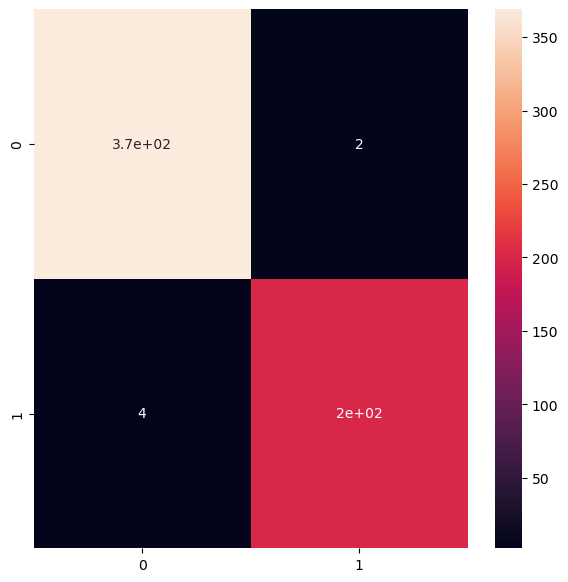

In [40]:
# Ploting the confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot = True)

In [41]:
from sklearn.metrics import confusion_matrix

def calculate_metrics(y_true, y_pred):
    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Extracting values from confusion matrix
    true_negative, false_positive, false_negative, true_positive = cm.ravel()

    # Calculating NPV, PPV, and TPR
    npv = true_negative / (true_negative + false_negative)
    ppv = true_positive / (true_positive + false_positive)
    tpr = true_positive / (true_positive + false_negative)

    return npv, ppv, tpr

# Example usage:
# Replace y_true and y_pred with your actual and predicted labels
y_true = original
y_pred = predict

npv, ppv, tpr = calculate_metrics(y_true, y_pred)

print("Negative Predictive Value (NPV):", npv)  # It represents the probability that a patient does not have the condition given that the test or model predicts a negative result.
print("Positive Predictive Value (PPV):", ppv)  # It represents the probability that a patient has the condition given that the test or model predicts a positive result.
print("True Positive Rate (TPR):", tpr)         # Also known as sensitivity or recall, it represents the proportion of actual positive cases that are correctly identified by the test or model.


Negative Predictive Value (NPV): 0.9892761394101877
Positive Predictive Value (PPV): 0.9901477832512315
True Positive Rate (TPR): 0.9804878048780488


Building a segmentation model to localize tumor

In [42]:
# Get the dataframe containing MRIs which have masks associated
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [43]:
# split the data into train and test data
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(brain_df_mask, test_size = 0.15)
X_test, X_val = train_test_split(X_val, test_size = 0.5)

In [44]:
# create separate list for imageId, classId to pass into the generator
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)
val_ids = list(X_val.image_path)
val_mask = list(X_val.mask_path)

In [45]:
from utilities import DataGenerator
training_generator = DataGenerator(train_ids,train_mask)
training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids, val_mask)
type(training_generator)

utilities.DataGenerator

In [46]:
type(validation_generator)

utilities.DataGenerator

In [47]:
def resblock(X, f):
  # make a copy of input
  X_copy = X
  # main path
  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)
  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  # Short path
  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)
  # Adding the output from main path and short path together
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [48]:
# function to upscale and concatenate the values passed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])
  return merge

In [49]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upsampling stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upsampling stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upsampling stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upsampling stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)
model_seg = Model(inputs = X_input, outputs = output )

In [50]:
model_seg.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['batch_normalization[0]

Training a segmentation Resunet model to localize tumor

In [51]:
# Loss Function:
'''We need a custom loss function to train this ResUNet, so we have used the loss function as it is from other github account '''

'We need a custom loss function to train this ResUNet, so we have used the loss function as it is from other github account '

In [52]:
# Utilities file contains the code for custom loss function and custom data generator

from utilities import focal_tversky, tversky_loss, tversky
from tensorflow.keras import backend as K
def focal_tversky(y_true,y_pred):
    ## IMPORTANT NOTE 11-1-1010/1:
    ## It seems that the type of y_true and y_pred are not the same. One is of type
    ## float32 and other int64. They need to be cast as the same type for the training
    ## to actually work.
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    #print(type(y_pred))
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [53]:
# Compile the model
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [54]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.hdf5", verbose=1, save_best_only=True)

In [55]:
history = model_seg.fit(training_generator, epochs = 1, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

72/72 [==============================] - ETA: 0s - loss: 0.8375 - tversky: 0.2097
Epoch 1: val_loss improved from inf to 0.87458, saving model to ResUNet-weights.hdf5


c:\Users\91707\anaconda3\lib\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



72/72 [==============================] - 168s 2s/step - loss: 0.8375 - tversky: 0.2097 - val_loss: 0.8746 - val_tversky: 0.1631


In [56]:
# Saving the model architecture to json file for future use
model_json = model_seg.to_json()
with open("ResUNet-model.jason", "w") as json_file:
  json_file.write(model_json)

Assessing trained segmentation resunet model performance

In [57]:
from utilities import focal_tversky, tversky_loss, tversky
with open('ResUNet-MRI.json', 'r') as json_file:
  json_savedModel = json_file.read()
# loading the model architecture
model_seg = tf.keras.models.model_from_json(json_savedModel)
model_seg.load_weights('weights_seg.hdf5')
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer= adam, loss = focal_tversky, metrics= [tversky])

In [58]:
from utilities import prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 100ms/step


In [59]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id, 'predicted_mask': mask, 'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_HT_7856_19950831/TCGA_HT_7856_19950831_25...,"[[[[6.626916e-07], [2.331612e-06], [4.6941095e...",1
1,TCGA_DU_8164_19970111/TCGA_DU_8164_19970111_8.tif,No mask,0
2,TCGA_DU_7008_19830723/TCGA_DU_7008_19830723_49...,No mask,0
3,TCGA_CS_6667_20011105/TCGA_CS_6667_20011105_10...,"[[[[8.874281e-07], [4.711381e-06], [1.0389826e...",1
4,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_10...,No mask,0
...,...,...,...
585,TCGA_FG_5964_20010511/TCGA_FG_5964_20010511_17...,"[[[[8.4985277e-07], [5.2066616e-06], [3.506093...",1
586,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_6.tif,No mask,0
587,TCGA_DU_8162_19961029/TCGA_DU_8162_19961029_25...,No mask,0
588,TCGA_DU_A5TU_19980312/TCGA_DU_A5TU_19980312_8.tif,No mask,0


In [60]:
# Merging the dataframe containing predicted results with the original test data
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_HT_7856_19950831/TCGA_HT_7856_19950831_25...,TCGA_HT_7856_19950831/TCGA_HT_7856_19950831_25...,1,"[[[[6.626916e-07], [2.331612e-06], [4.6941095e...",1
1,TCGA_DU_8164_19970111/TCGA_DU_8164_19970111_8.tif,TCGA_DU_8164_19970111/TCGA_DU_8164_19970111_8_...,0,No mask,0
2,TCGA_DU_7008_19830723/TCGA_DU_7008_19830723_49...,TCGA_DU_7008_19830723/TCGA_DU_7008_19830723_49...,0,No mask,0
3,TCGA_CS_6667_20011105/TCGA_CS_6667_20011105_10...,TCGA_CS_6667_20011105/TCGA_CS_6667_20011105_10...,1,"[[[[8.874281e-07], [4.711381e-06], [1.0389826e...",1
4,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_10...,TCGA_DU_A5TW_19980228/TCGA_DU_A5TW_19980228_10...,0,No mask,0


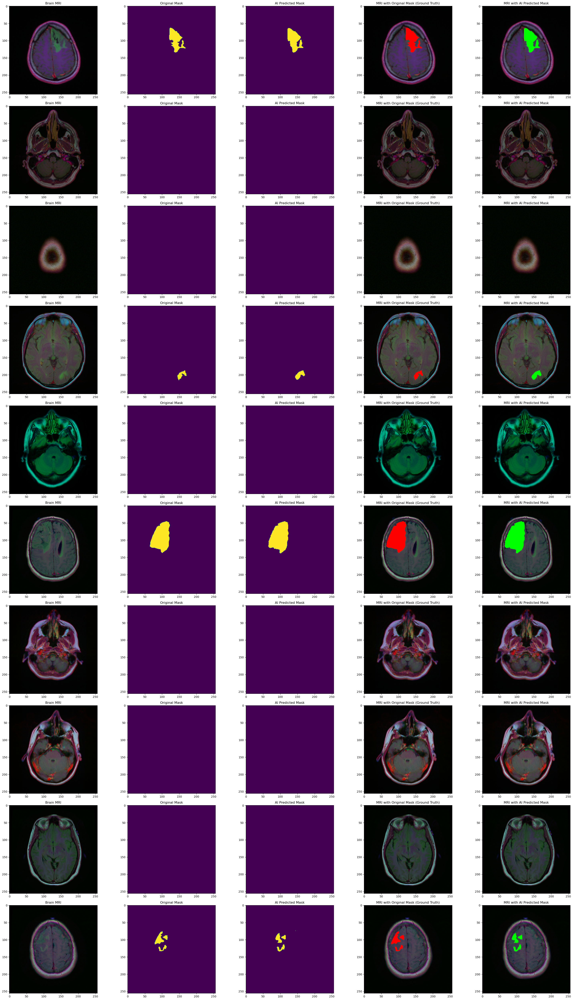

In [65]:
# Creating a subplot grid for visualizing 10 images with multiple subplots
count = 0
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
    if count < 10:
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        # Obtaining the mask for the image
        mask = io.imread(df_pred.mask_path[i])
        axs[count][1].title.set_text("Original Mask")
        axs[count][1].imshow(mask)

        # Obtaining the predicted mask for the image
        predicted_mask_value = df_pred.predicted_mask[i]
        if isinstance(predicted_mask_value, str) and predicted_mask_value.lower() == 'no mask':
            # Handling the case where the predicted mask is a string, e.g., 'No mask'
            predicted_mask = np.zeros_like(mask)
        else:
            # Convert to float and round for other cases
            predicted_mask = np.squeeze(predicted_mask_value).astype(np.float32).round()

        axs[count][2].title.set_text("AI Predicted Mask")
        axs[count][2].imshow(predicted_mask)

        # Applying the mask to the image
        img[mask == 255] = (255, 0, 0)
        axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
        axs[count][3].imshow(img)

        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[predicted_mask == 1] = (0, 255, 0)
        axs[count][4].title.set_text("MRI with AI Predicted Mask")
        axs[count][4].imshow(img_)
        count += 1
fig.tight_layout()
plt.show()


Trying for flask 

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [08/Jun/2024 00:53:57] "GET / HTTP/1.1" 200 -


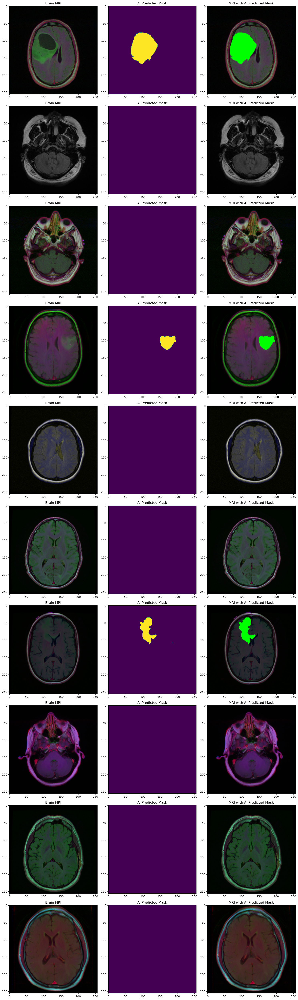

In [71]:
import random
from flask import Flask, render_template_string
from io import BytesIO
import base64
import matplotlib.pyplot as plt
import cv2
import numpy as np
from skimage import io
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

app = Flask(__name__)

def generate_plot():
    num_images = 10
    random_indices = random.sample(range(len(df_pred)), num_images)
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 50))

    for count, i in enumerate(random_indices):
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        # Obtaining the predicted mask for the image
        predicted_mask_value = df_pred.predicted_mask[i]
        if isinstance(predicted_mask_value, str) and predicted_mask_value.lower() == 'no mask':
            # Handling the case where the predicted mask is a string, e.g., 'No mask'
            predicted_mask = np.zeros(img.shape[:2], dtype=np.uint8)
        else:
            # Convert to float and round for other cases
            predicted_mask = np.squeeze(predicted_mask_value).astype(np.float32).round()

        axs[count][1].title.set_text("AI Predicted Mask")
        axs[count][1].imshow(predicted_mask)

        # Applying the mask to the image
        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[predicted_mask == 1] = (0, 255, 0)
        axs[count][2].title.set_text("MRI with AI Predicted Mask")
        axs[count][2].imshow(img_)

    fig.tight_layout()
    # Convert the plot to an image
    output = BytesIO()
    FigureCanvas(fig).print_png(output)
    return base64.b64encode(output.getvalue()).decode()

@app.route('/')
def index():
    plot_data = generate_plot()
    return render_template_string('''
        <html>
        <body>
            <h1>Brain MRI Visualization</h1>
            <img src="data:image/png;base64,{{ plot_data }}" alt="Visualization">
        </body>
        </html>
    ''', plot_data=plot_data)

if __name__ == '__main__':
    app.run(port=5000)